# AM Radio Project

# Project Overview

My objective was to construct an AM radio receiver and characterize each part of the circuit:

• The LRC circuit, which filters the input to select a particular carrier frequency

• The rectifier/filter used to extract the audio signal from the carrier frequency

• The amplifier used to amplify the audio signal and drive a speaker.

I worked on the detection of amplitude modulated radio signals (A.M. radio, not F.M.)

## Diagram of an A.M. radio receiver

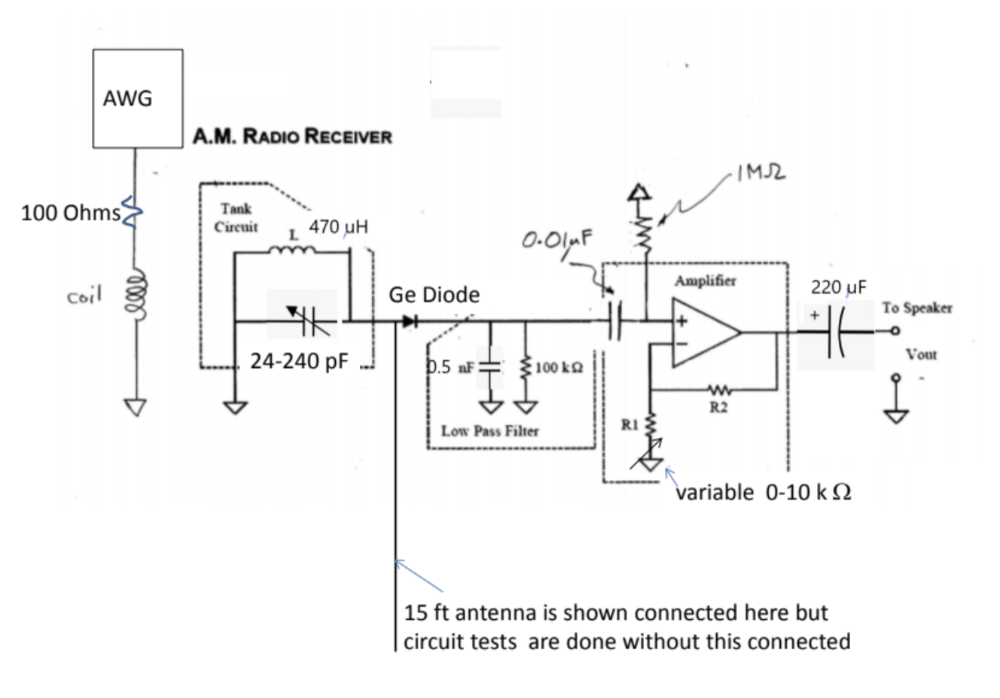

Main components of an AM radio receiver. The antenna picks up the electromagnetic radiation from nearby radio broadcast station. This is coupled (or directly connected) to the tank circuit, which is tuned so that it resonates at the carrier frequency. This results in electric current and charge oscillations in the tank circuit which in turn produces an oscillating voltage signal on input side of the diode which is proportional to the mixed radio signal. A Ge diode rectifies this signal, passing only the positive voltages. A low pass filter suppresses the high frequency spikes which occur at the carrier frequency, leaving only the modulation frequency which is the audio frequency signal. This process is called ”demodulation”. The resulting audio signal is then amplified and fed to the speaker.

# Amplifier Notes

To begin this portion of the AM radio, I assembled the circuit for a non-inverting amplifier using the LF 411 OpAmp, the 0.01 μF capacitor, 1 M Ohm resistor and also the 220 μF capacitor from the Op Amp output. As per the figure shown in the beginning of these notes, I chose R2 to be 10 kOhm and choose R1 to be a 0-10 kOhm variable resistor. I adjusted R1 to be 2.5 kOhm before installing it on the circuit.


The variable resistor allows us to change the gain, which controls the speaker volume for the radio.

## Initial Amplifier Measurements

0.01 μF capacitor = 0.01069 +/- 0.00026 μF = 10.69 +/- 0.26 nF (using 2% + 0.05 as per DMM manual)\
1 M Ohm resistor = 0.992 +/- 0.018 M Ohms (1.5% + 0.003 as per DMM manual)\
220 μF capacitor = 202.3 +/- 4.5 μF (using 2% + 0.5 as per DMM manual)\
R2 10 kOhm resistor = 9.89 +/- 0.079 kOhms as uncertainty listed in the DMM instrument manual is 0.5% + 0.03\
R1 0-10 kOhm variable resistor set to 2.5 kOhm = 2.505 +/- 0.016 kOhms

## Amplifier Measurement Notes (1 kHz Freq)
- Distortion is similar to previous results, in the form of clipping of sine wave at peaks and troughs.
- Bottom peak starts getting distorted at 1.320 Vpp
- Top peak starts getting distorted at 1.690 Vpp
- Fully distorted / maximum V_out at 1.750 Vpp V_in.
- V_in between 0-1.320V results in an undistorted V_out

Slope is 5.03595733789432 +/- 0.07160927605570142
Intercept is 0.01699645167340188 +/- 0.028595628704389874

Goodness of fit - Chi-squared measure:
degrees of freedom = 4, Chi2 = 0.6455063589867532, Chi2/dof = 0.1613765897466883



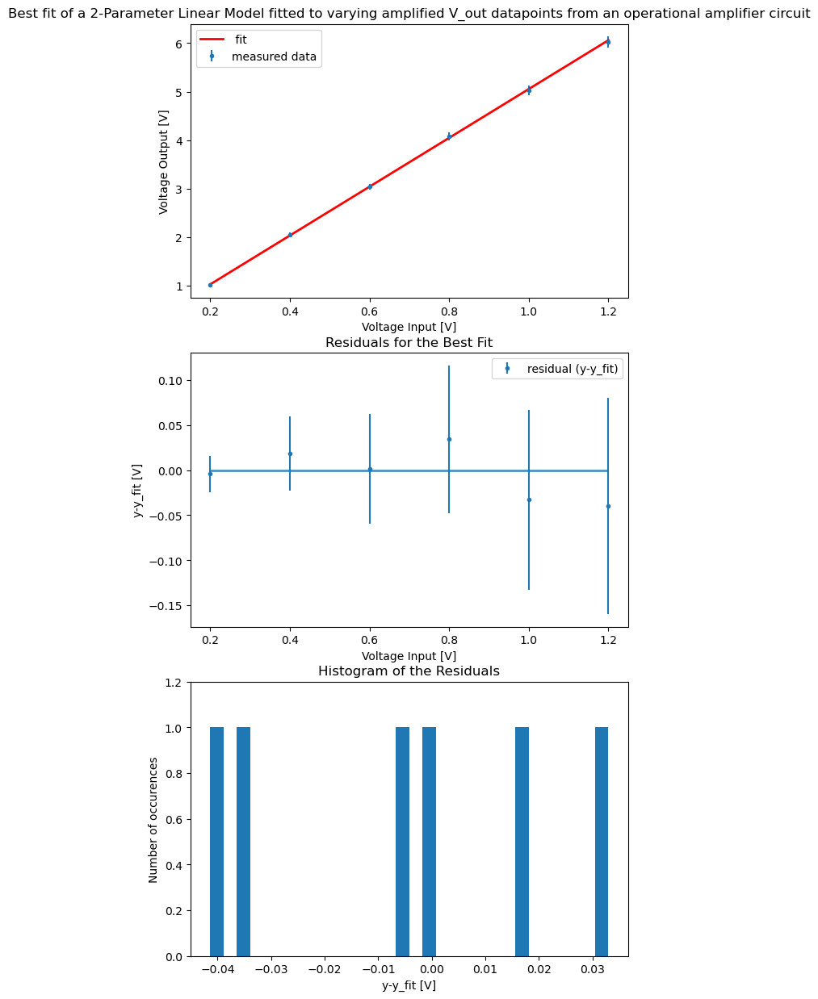

In [3]:
# The script below fits to a sine wave, but can be modified for other functions
# First, we load some python packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# LIST OF ALL INPUTS

# fname is assumed to be in a four-column .csv file (comma separated values). The first two rows are
# assumed to be headers, like those produced in our code for packing oscilloscope data.
# The four columns are x-values, x-uncertainties, y-values, y-uncertainties.
# The .csv file must be in the same
# folder as this fit program, otherwise the full file extension must be added
# to fname: e.g. fname = 'folder/subfolder/subsubfolder/file.csv'

"""
Modify the following line to change the file name containing your data
"""
fname = "Radio 1 kHz.csv"

x_name = 'Voltage Input'
x_units = 'V'
y_name = 'Voltage Output'
y_units = 'V'

# The model you will fit to is defined below, in this case a sine wave.
# The parameters in the model are amplitude, freqency, and phase.
# To get a least squares fitting process started, it is necessary to provide good
# initial guesses for the parameters. From your plots of the data so far, you can make good guesses at these parameters.

param_names = ["slope", "intercept"]


# definition of the fit function
# def fit_function(x, amplitude,tau):

# fit function is a linear model with slope and intercept

def fit_function(x, slope, intercept):
    return x*slope + intercept


# load the file "fname", defined above
data = np.loadtxt(fname, delimiter=",", comments="#", usecols=(0, 1, 2, 3), skiprows=2)

"""
Here is where you access the data columns.
You may need tyo alter these to choose what is on the y-axis and what is on the x-axis.
"""

x = data[:, 0]
y = data[:, 2]
y_sigma = data[:, 3]

# calculate the best fit slope - this is the analytical solution for a 2-parameter fit to a striaght line
Delta = sum(1/y_sigma**2)*sum((x/y_sigma)**2) - (sum(x/y_sigma**2)**2)
m = (sum(1/y_sigma**2)*sum(x*y/y_sigma**2) - sum(x/y_sigma**2)*sum(y/y_sigma**2))/Delta

# calculate uncertainty of the best fit slope
m_sigma = np.sqrt(sum(1/y_sigma**2)/Delta)

print ("Slope is", m, "+/-", m_sigma)

# calculate the best fit intercept
b = (sum((x/y_sigma)**2)*sum(y/y_sigma**2) - sum(x/y_sigma**2)*sum(x*y/y_sigma**2))/Delta

# calculate uncertainty of the best fit intercept
b_sigma = np.sqrt(sum((x/y_sigma)**2)/Delta)
                        
print ("Intercept is", b, "+/-", b_sigma)
###############################################################################
# calculates and prints the chi-squared, degrees of freedon, and weighted chi-squared
###############################################################################

# function that  calculates the chi square value of a fit
def chi_square (param1, param2, x, y, sigma):
#
    return np.sum((y-fit_function(x, param1, param2))**2/sigma**2)
    
# calculate and print chi square as well as the per degree-of-freedom value
chi2 = chi_square(m,b,x,y,y_sigma)
# degrees of freedom is the number of data points minus the number of parameters
dof = len(x) - 2
print ("\nGoodness of fit - Chi-squared measure:")
print ("degrees of freedom = {}, Chi2 = {}, Chi2/dof = {}\n".format(dof, chi2, chi2/dof))


# residual is the difference between the data and model
x_fitfunc = np.linspace(min(x), max(x), 500)
y_fitfunc = fit_function(x_fitfunc, m ,b)
y_fit = fit_function(x, m,b)
residual = y-y_fit
# creates a histogram of the residuals
hist,bins = np.histogram(residual,bins=30)

fig = plt.figure(figsize=(7,15))

ax1 = fig.add_subplot(311)
ax1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="measured data")
ax1.plot(x_fitfunc,y_fitfunc,marker="",linestyle="-",linewidth=2,color="r",
         label=" fit")
# add axis labels and title
ax1.set_xlabel('{} [{}]'.format(x_name,x_units))
ax1.set_ylabel('{} [{}]'.format(y_name,y_units))
ax1.set_title('Best fit of a 2-Parameter Linear Model fitted to varying amplified V_out datapoints from an operational amplifier circuit')

# set the x and y boundaries of your plot
#plt.xlim(lower_x,upper_x)
#plt.ylim(lower_y,upper_y)
# show a legend. loc='best' places legend where least amount of data is 
# obstructed. 
ax1.legend(loc='best',numpoints=1)


# this code produces a figure with a plot of the residuals as well
# as a histogram of the residuals. 
# fig = plt.figure(figsize=(7,10))
ax2 = fig.add_subplot(312)
ax2.errorbar(x,residual,yerr=y_sigma,marker='.',linestyle='',
             label="residual (y-y_fit)")
ax2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
ax2.set_xlabel('{} [{}]'.format(x_name,x_units))
ax2.set_ylabel('y-y_fit [{}]'.format(y_units))
ax2.set_title('Residuals for the Best Fit')
ax2.legend(loc='best',numpoints=1)
ax3 = fig.add_subplot(313)
ax3.bar(bins[:-1],hist,width=bins[1]-bins[0])

ax3.set_ylim(0,1.2*np.max(hist))
ax3.set_xlabel('y-y_fit [{}]'.format(y_units))
ax3.set_ylabel('Number of occurences')
ax3.set_title('Histogram of the Residuals')

"""
Modify the following lines to change the name of the file used to store a JPEG of your best fit graphs
"""

# Before showing the plot, you can also save a copy of the figure as a JPEG.
# The order is important here because plt.show clears the plot information after displaying it. 
plt.savefig('FittingResults.jpeg')
plt.show()

## Measure of gain's independence of frequency

A good audio amplifier needs to gain that is independent of frequency up to about 20 kHz (our range of hearing). 

- I measured this with a V_in of 600mV, with varying frequencies between 1kHz and 25kHz, and observed that gain is independent of frequency for this range. I measured higher values and observed a small decrease in gain beginning at 110 kHz, and no gain around the 4 MHz range.

Intercept is 4.848515770019491 +/- 0.014984735942174332


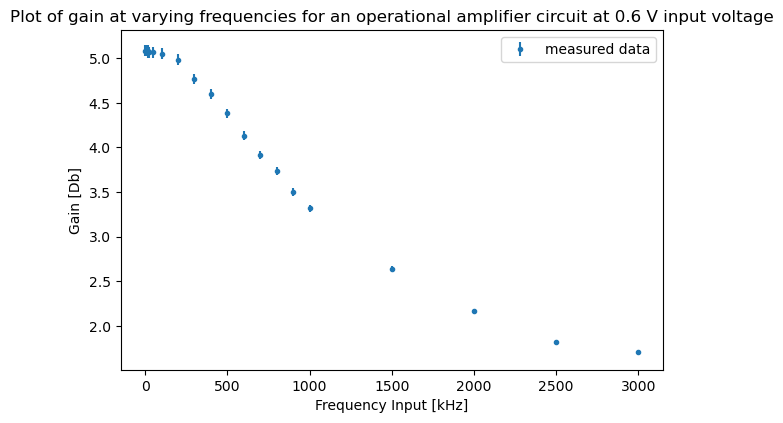

In [4]:
# The script below fits to a sine wave, but can be modified for other functions
# First, we load some python packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# LIST OF ALL INPUTS

# fname is assumed to be in a four-column .csv file (comma separated values). The first two rows are
# assumed to be headers, like those produced in our code for packing oscilloscope data.
# The four columns are x-values, x-uncertainties, y-values, y-uncertainties.
# The .csv file must be in the same
# folder as this fit program, otherwise the full file extension must be added
# to fname: e.g. fname = 'folder/subfolder/subsubfolder/file.csv'

"""
Modify the following line to change the file name containing your data
"""
fname = "Radio freq variable.csv"

x_name = 'Frequency Input'
x_units = 'kHz'
y_name = 'Gain'
y_units = 'Db'

# The model you will fit to is defined below, in this case a sine wave.
# The parameters in the model are amplitude, freqency, and phase.
# To get a least squares fitting process started, it is necessary to provide good
# initial guesses for the parameters. From your plots of the data so far, you can make good guesses at these parameters.

param_names = ["slope", "intercept"]


# definition of the fit function
# def fit_function(x, amplitude,tau):

# fit function is a linear model with slope and intercept

def fit_function(x, slope, intercept):
    return x*slope + intercept


# load the file "fname", defined above
data = np.loadtxt(fname, delimiter=",", comments="#", usecols=(0, 1, 2, 3), skiprows=2)

"""
Here is where you access the data columns.
You may need tyo alter these to choose what is on the y-axis and what is on the x-axis.
"""

x = data[:, 0]
y = data[:, 2]
y = y/0.6
y_sigma = data[:, 3]

# calculate the best fit slope - this is the analytical solution for a 2-parameter fit to a striaght line
Delta = sum(1/y_sigma**2)*sum((x/y_sigma)**2) - (sum(x/y_sigma**2)**2)
m = (sum(1/y_sigma**2)*sum(x*y/y_sigma**2) - sum(x/y_sigma**2)*sum(y/y_sigma**2))/Delta

# calculate uncertainty of the best fit slope
m_sigma = np.sqrt(sum(1/y_sigma**2)/Delta)

#print ("Slope is", m, "+/-", m_sigma)

# calculate the best fit intercept
b = (sum((x/y_sigma)**2)*sum(y/y_sigma**2) - sum(x/y_sigma**2)*sum(x*y/y_sigma**2))/Delta

# calculate uncertainty of the best fit intercept
b_sigma = np.sqrt(sum((x/y_sigma)**2)/Delta)
                        
print ("Intercept is", b, "+/-", b_sigma)
###############################################################################
# calculates and prints the chi-squared, degrees of freedon, and weighted chi-squared
###############################################################################

# function that  calculates the chi square value of a fit
# def chi_square (param1, param2, x, y, sigma):
# #
#     return np.sum((y-fit_function(x, param1, param2))**2/sigma**2)
    
# # calculate and print chi square as well as the per degree-of-freedom value
# chi2 = chi_square(m,b,x,y,y_sigma)
# # degrees of freedom is the number of data points minus the number of parameters
# dof = len(x) - 2
# print ("\nGoodness of fit - Chi-squared measure:")
# print ("degrees of freedom = {}, Chi2 = {}, Chi2/dof = {}\n".format(dof, chi2, chi2/dof))


# residual is the difference between the data and model
x_fitfunc = np.linspace(min(x), max(x), 500)
y_fitfunc = fit_function(x_fitfunc, m ,b)
y_fit = fit_function(x, m,b)
residual = y-y_fit
# creates a histogram of the residuals
hist,bins = np.histogram(residual,bins=30)

fig = plt.figure(figsize=(7,15))

ax1 = fig.add_subplot(311)
ax1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="measured data")
# ax1.plot(x_fitfunc,y_fitfunc,marker="",linestyle="-",linewidth=2,color="r",
#          label=" fit")
# add axis labels and title
ax1.set_xlabel('{} [{}]'.format(x_name,x_units))
ax1.set_ylabel('{} [{}]'.format(y_name,y_units))
ax1.set_title('Plot of gain at varying frequencies for an operational amplifier circuit at 0.6 V input voltage')

# set the x and y boundaries of your plot
#plt.xlim(lower_x,upper_x)
#plt.ylim(lower_y,upper_y)
# show a legend. loc='best' places legend where least amount of data is 
# obstructed. 
ax1.legend(loc='best',numpoints=1)


# # this code produces a figure with a plot of the residuals as well
# # as a histogram of the residuals. 
# # fig = plt.figure(figsize=(7,10))
# ax2 = fig.add_subplot(312)
# ax2.errorbar(x,residual,yerr=y_sigma,marker='.',linestyle='',
#              label="residual (y-y_fit)")
# ax2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
# ax2.set_xlabel('{} [{}]'.format(x_name,x_units))
# ax2.set_ylabel('y-y_fit [{}]'.format(y_units))
# ax2.set_title('Residuals for the Best Fit')
# ax2.legend(loc='best',numpoints=1)
# ax3 = fig.add_subplot(313)
# ax3.bar(bins[:-1],hist,width=bins[1]-bins[0])

# ax3.set_ylim(0,1.2*np.max(hist))
# ax3.set_xlabel('y-y_fit [{}]'.format(y_units))
# ax3.set_ylabel('Number of occurences')
# ax3.set_title('Histogram of the Residuals')

"""
Modify the following lines to change the name of the file used to store a JPEG of your best fit graphs
"""

# Before showing the plot, you can also save a copy of the figure as a JPEG.
# The order is important here because plt.show clears the plot information after displaying it. 
plt.savefig('FittingResults.jpeg')
plt.show()

### Plot of gain versus frequency showing where gain is flat and also where it rolls off at high frequency.

The gain appears to remain at a near-constant measured 5 Db from 1 kHz until a small (but noticeable) decrease in gain beginning at 110 kHz. The recorded datapoints are approaching a gain of 1 (no amplification) above the ~3 MHz range.

Demodulation-rectifier/ low pass filter notes

Next, I assembled the circuit for demodulating an AM radio signal using a germanium diode, which acts as a rectifier, followed by a low pass filter that filters out the carrier frequency. To do this, I used a 0.5 nF capacitor and a 100 kOhm resistor. I noticed the Ge diode was different from the Si diode used in our second experiment and has a smaller ”turn on” voltage.

## Initial Measurements

Germanium diode: Tested forward biased nature by using DMM's diode test function\
0.5 nF capacitor: 0.449 +/- 0.059 nF (based on DMM's 2% + 0.05)\
100 kOhm resistor: 99.5 +/- 0.80 kOhms (based on DMM's 0.5% + 0.3)

Input signal - yellow (channel 1) direct from function generator
Amplitude (peak to peak) = 524 +/- 10 mV (based on oscilloscope manual's 2% uncertainty)

Output signal - blue (channel 2) 
Amplitude (peak to peak) = 92.0 +/- 1.8 mV (based on oscilloscope manual's 2% uncertainty)


### Low-Pass Experiment Procedure 
I set ModFreq on the function generator to 6.9 kHz, as per the requirements for an AM radio.

Since the diode doesn't pass negative amplitudes, the output only has the peaks of the original input. This can be seen in the image below. The resistor and capacitor in parallel act as a low pas filter, only letting the lowest frequencies of out input through in the rectified signal.

Vertical offset of the output signal is 66.0 +/- 1.3 mV (based on oscilloscope manual's 2% uncertainty). This is seen as a 20 mV offset from horizontal axis and bottom of wave.

Frequency is measured to be 6.94 +/- 0.14 kHz (based on oscilloscope manual's 2% uncertainty), which is the same as input when you take uncertainty into account.

For the measurements, I used:\
Left of the diode - input signal\
Right of the diode - output signal

### Hypothesis for vertical offset

According to my hypothesis, the vertical offset is a result of the average of low-passed signals being positive (above 0).


## Method for low-pass filter
To achieve this, I used the output from this demodulation circuit as the input to the amplifier circuit (connected the demodulation output to the capacitor at the amplifier input). I then measured the output signal from the amplifier (after the capacitor) while applying the the modulated signal to the input of the demodulation circuit on the left side of the diode. 

### Main findings:
No apparent or measured vertical offset
Amplitude (VPP) = 86.0 +/- 1.7 mV (based on oscilloscope manual's 2% uncertainty) 
Frequency is measured to be 6.94 +/- 0.14 kHz (based on oscilloscope manual's 2% uncertainty). This is the same as input frequency if you take uncertainty into account\
There also appears to be an extremely small phase shift, which may have been caused by the oscilloscope's trigger settings.

# LC Circuit Tuning Notes

I assembled the LC circuit shown above, consisting of a blue
471 microH inductor and a variable capacitor which allows the capacitance
to vary between 24 and 240 pF. 

Winding the coil with about 10 turns tightly around the inductor was fairly tricky due to the inductor's small size, but I managed to get the wire coiled, grounded, and connected the other end to a 100 Ohm resistor.


This coil's purpose, as mentioned earlier, was to inductively couple the amplitude modulated signal to the LC circuit. 

I did the following when recording data:

- used the function generator to create an AM signal. 
- connected the voltage signal to the 100 Ohm resistor and the ground side of the function generator to the circuit ground
- used a frequency of 690 kHz, an amplitude of 0.5 V, and amplitude modulation at 6.9 kHz.
- adjusted the capacitor slowly to maximize the output amplitude. An example of what you should see close to resonance is shown in

### LC component measurements
Inductance measured to be 462.0 +/- 24.1 mH (5% + 1 according inductance machine manuals' listed uncertainty)\
100 ohm resistor: 99.49 +/- 1.79 ohms (using the DMM manuals listed 1.5% + 3 uncertainty)


Maximum amplified output amplitude = 639 +/- 15 mV (using DMM's listed uncertainty of 2% + 3)
When adjusting variable capacitor, amplitude increases up until a certain point, and then drops to 0.
Right before this point I measured the maximum achievable amplitude above.

Measurement of capacitor at maximum output amplitude: 0.0710 +/- 0.0017 nF (using DMM's listed uncertainty of 2% + 0.0003)

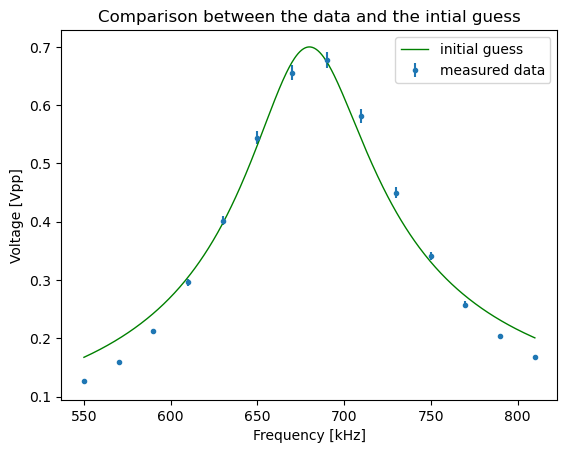

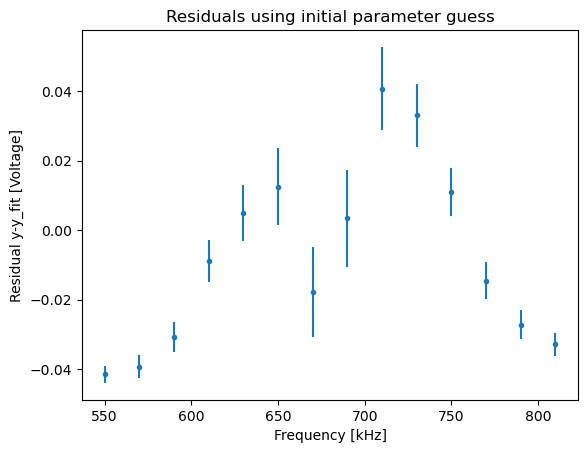


Goodness of fit - chi square measure:
Chi-squared =  247.53074948169404
Chi-squared/dof =  22.50279540742673
Fit parameters:
amplitude = 7.516e-01 +/- 1.050e-02
gamma = 3.680e+02 +/- 6.613e+00
resFreq = 6.829e+02 +/- 4.686e-01


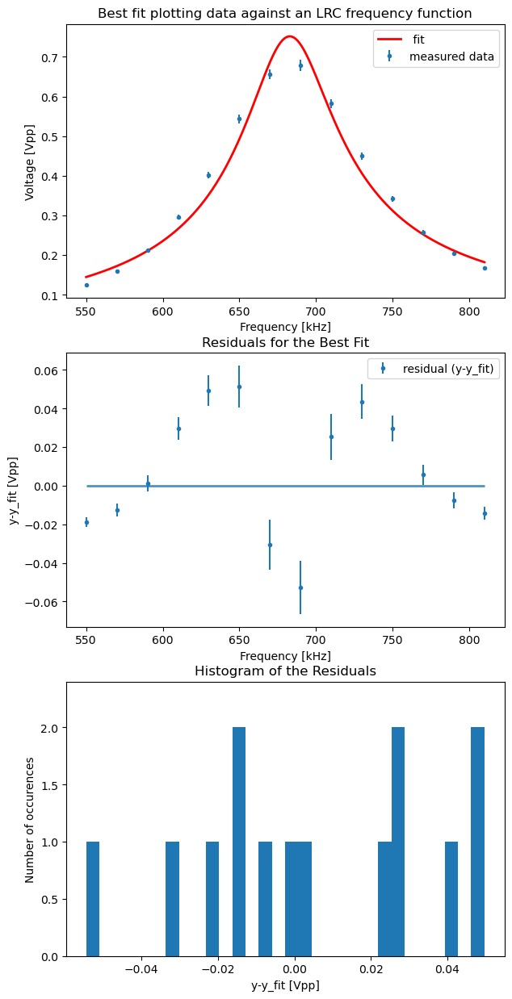

In [5]:
# The script below fits to a sine wave, but can be modified for other functions
# First, we load some python packages
import matplotlib.pyplot as plt
import numpy as np
from scipy.optimize import curve_fit

# LIST OF ALL INPUTS

# fname is assumed to be in a four-column .csv file (comma separated values). The first row is
# assumed to be headers, like those produced in our code for packing oscilloscope data.
# The four columns are x-values, x-uncertainties, y-values, y-uncertainties.
# The .csv file must be in the same
# folder as this fit program, otherwise the full file extension must be added
# to fname: e.g. fname = 'folder/subfolder/subsubfolder/file.csv'

"""
Modify the following line to change the file name containing your data
"""
fname = "Radio Part3.csv"

x_name = "Frequency"
x_units = "kHz"
y_name = "Voltage"
y_units = "Vpp"

# The model you will fit to is defined below, in this case a sine wave.
# The parameters in the model are amplitude, freqency, and phase.
# To get a least squares fitting process started, it is necessary to provide good
# initial guesses for the parameters. From your plots of the data so far, you can make good guesses at these parameters.

"""
Modify the following two lines to change the parameter names and to set initial guesses for the parameters
"""

#banana
param_names = ["amplitude", "gamma", "resFreq"]
guesses = (0.7, 450, 680)

# definition of the fit function
# def fit_function(x, amplitude,tau):

"""
Modify the following two lines to change the fitting model and the parameters in that model
"""
#banana

def fit_function(x, amplitude, gamma, resFreq):
    return amplitude / np.sqrt(1 + ((2 * np.pi) / (gamma * x))**2 * (((x)**2 - (resFreq)**2)**2))

# load the file "fname", defined above
data = np.loadtxt(fname, delimiter=",", comments="#", usecols=(0, 1, 2, 3), skiprows=2)

# access the data columns
x = data[:, 0]
y = data[:, 2]
y_sigma = data[:, 3]


# define an array of frequency points for plotting the theory function
xtheory = np.linspace(min(x), max(x), 500)
# compares the guessed curve to the data for visual reference
y_guess = fit_function(xtheory, *guesses)
plt.errorbar(x, y, yerr=y_sigma, marker=".", linestyle="", label="measured data")
plt.plot(
    xtheory,
    y_guess,
    marker="",
    linestyle="-",
    linewidth=1,
    color="g",
    label="initial guess",
)
plt.xlabel("{} [{}]".format(x_name, x_units))
plt.ylabel("{} [{}]".format(y_name, y_units))
plt.title(r"Comparison between the data and the intial guess")
plt.legend(loc="best", numpoints=1)
plt.show()


# calculate the value of the model at each of the x-values of the data set
y_fit = fit_function(x, *guesses)
# residual is the difference between the data and theory
residual = y - y_fit

# plot the residuals
plt.errorbar(x, residual, yerr=y_sigma, marker=".", linestyle="", label="residuals")
plt.xlabel("{} [{}]".format(x_name, x_units))
plt.ylabel("Residual y-y_fit [{}]".format(y_name, y_units))
plt.title("Residuals using initial parameter guess")
plt.show()

# fit the data to fit_function. fit_params is the resultant parameters, fit_cov
# is the covariance matrix between all the parameters. maxfev=10**5 means the
# fitting procedure is iterated at maximum 10^5 times before giving up.
fit_params, fit_cov = curve_fit(
    fit_function, x, y, sigma=y_sigma * np.ones(len(x)), p0=guesses, maxfev=10**5
)
# fit_params,fit_cov = curve_fit(fit_function,x,y,sigma=y_sigma,p0=guesses,
#                               maxfev=10**5)

###############################################################################
# prints the chi2
# ##############################################################################


# function that  calculates the chi square value of a fit
def chi_square(fit_parameters, x, y, sigma):
    if sigma is None:
        sigma = 1.0
    return np.sum((y - fit_function(x, *fit_parameters)) ** 2 / sigma**2)


# calculate and print chi square as well as the per degree-of-freedom value
chi2 = chi_square(fit_params, x, y, y_sigma)
dof = len(x) - len(fit_params)
print("\nGoodness of fit - chi square measure:")
print("Chi-squared = ", chi2)
print("Chi-squared/dof = ", chi2 / dof)

###############################################################################
# prints the fit parameters (with uncertainty)
# ##############################################################################

# the covariance matrix is rescaled to cancel the inverse scaling that is
# performed for numerical reasons during execution of curve_fit -- do not
# change this line!
fit_cov = fit_cov * dof / chi2
# calculate the standard deviation as uncertainty of the fit parameters
fit_params_error = np.sqrt(np.diag(fit_cov))

# read out parameter results
print("Fit parameters:")
for i in range(len(fit_params)):
    print(
        "{} = {:.3e} +/- {:.3e}".format(
            param_names[i], fit_params[i], fit_params_error[i]
        )
    )


# prints out the covariance between all variables. Uncomment this code to see
# the results of this more sophisticated statistical measure.
# print "\nCovariance between fit parameters:"
# for i,fit_covariance in enumerate(fit_cov):
#    for j in xrange(i+1,len(fit_covariance)) :
#        print "{} and {} : {:.3e}".format(param_names[i],
#                                          param_names[j],
#                                          fit_cov[i,j])


# residual is the difference between the data and model
x_fitfunc = np.linspace(min(x), max(x), 500)
y_fitfunc = fit_function(x_fitfunc, *fit_params)
y_fit = fit_function(x, *fit_params)
residual = y-y_fit
# creates a histogram of the residuals
hist,bins = np.histogram(residual,bins=30)

fig = plt.figure(figsize=(7,15))

ax1 = fig.add_subplot(311)
ax1.errorbar(x,y,yerr=y_sigma,marker='.',linestyle='',label="measured data")
ax1.plot(x_fitfunc,y_fitfunc,marker="",linestyle="-",linewidth=2,color="r",
         label=" fit")
# add axis labels and title
ax1.set_xlabel('{} [{}]'.format(x_name,x_units))
ax1.set_ylabel('{} [{}]'.format(y_name,y_units))
ax1.set_title('Best fit plotting data against an LRC frequency function')
# set the x and y boundaries of your plot
#plt.xlim(lower_x,upper_x)
#plt.ylim(lower_y,upper_y)
# show a legend. loc='best' places legend where least amount of data is 
# obstructed. 
ax1.legend(loc='best',numpoints=1)


# this code produces a figure with a plot of the residuals as well
# as a histogram of the residuals. 
# fig = plt.figure(figsize=(7,10))
ax2 = fig.add_subplot(312)
ax2.errorbar(x,residual,yerr=y_sigma,marker='.',linestyle='',
             label="residual (y-y_fit)")
ax2.hlines(0,np.min(x),np.max(x),lw=2,alpha=0.8)
ax2.set_xlabel('{} [{}]'.format(x_name,x_units))
ax2.set_ylabel('y-y_fit [{}]'.format(y_units))
ax2.set_title('Residuals for the Best Fit')
ax2.legend(loc='best',numpoints=1)
ax3 = fig.add_subplot(313)
ax3.bar(bins[:-1],hist,width=bins[1]-bins[0])

ax3.set_ylim(0,1.2*np.max(hist))
ax3.set_xlabel('y-y_fit [{}]'.format(y_units))
ax3.set_ylabel('Number of occurences')
ax3.set_title('Histogram of the Residuals')

"""
Modify the following lines to change the name of the file used to store a JPEG of your best fit graphs
"""

# Before showing the plot, you can also save a copy of the figure as a JPEG.
# The order is important here because plt.show clears the plot information after displaying it. 
plt.savefig('LRCFittingResults.jpeg')
plt.show()

### Initial Plot Observations

As expected, the signal seen at the amplifier output was a maximum around when the LC circuit’s resonant frequency was tuned to match the 690 kHz carrier frequency.

## Testing the AM receiver

To test the AM receiver, I disconnected the function generator and install a speaker with one end connected to the amplifier output after the capacitor and one end connected to ground. I then connected the long the antenna wire which was set up for us by the course staff to the circuit. 

To double check everything was wired correctly, I ensured the antenna was connected to the right side of the variable capacitor (which is also the left side of the diode).

When using the USB connector from the laptop (instead of the wall plug adapter to avoid additional 60 Hz noise), I had to retune the capacitor since the antenna changes the resonant frequency. 

At the end, i removed the speaker and connected the circuit up to the oscilloscope to see the signal that I heard for the loudest station.

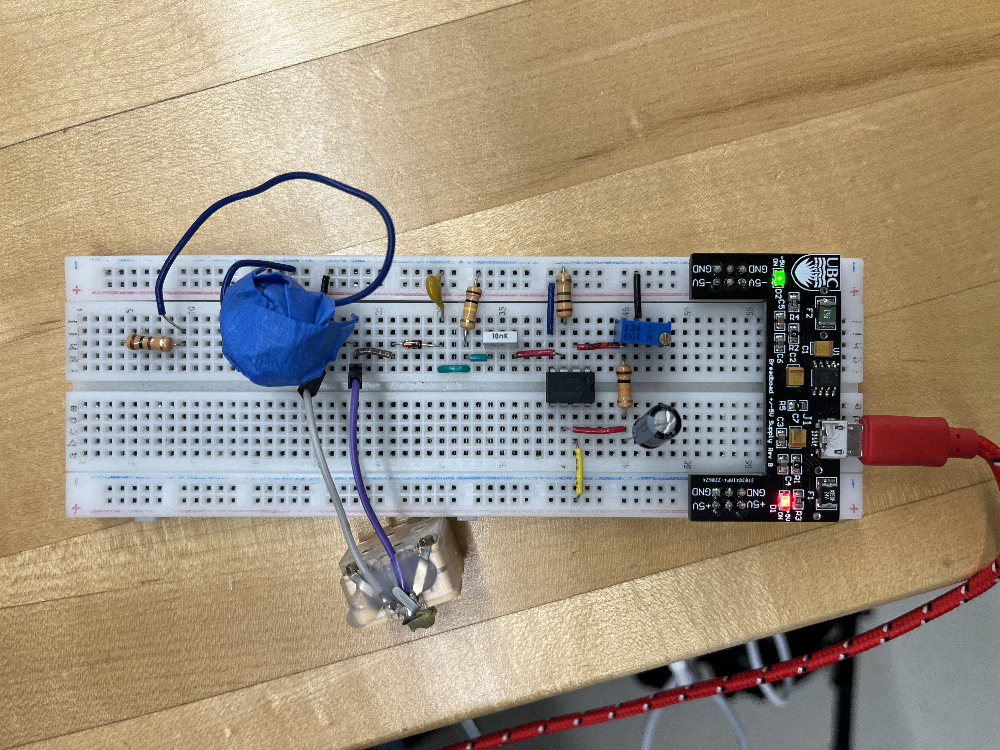
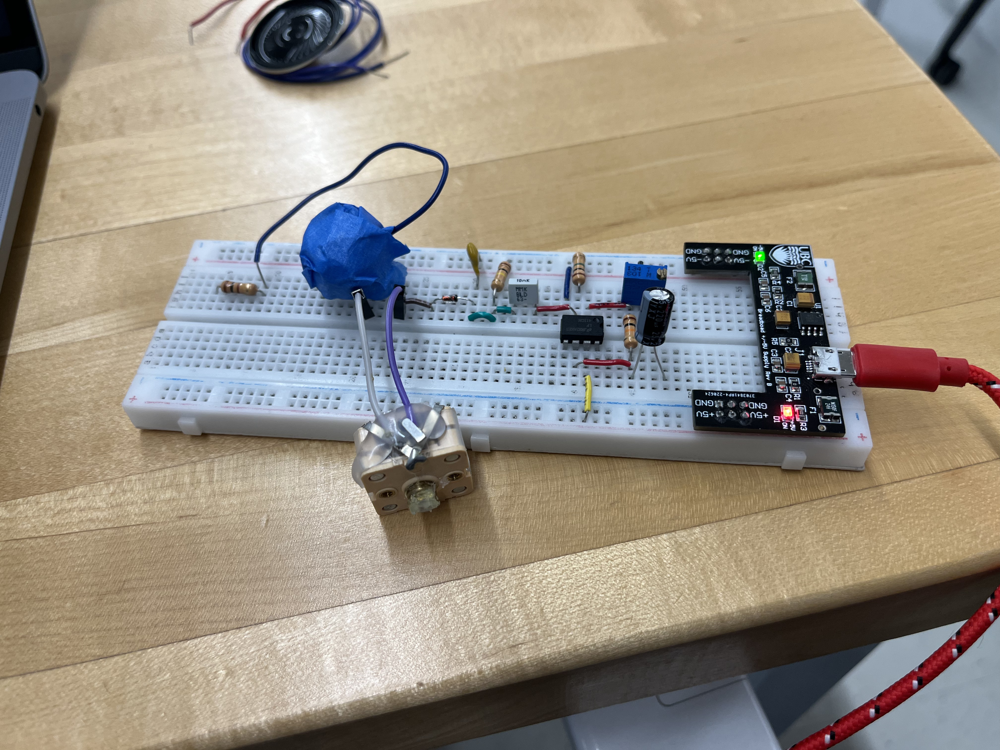

# Final Results

### Plot results

**1) Best fit of a 2-Parameter Linear Model fitted to varying amplified V_out datapoints from an operational amplifier circuit**

- Slope is 5.036 +/- 0.072 Db
- Intercept is 0.017 +/- 0.029 V, which falls within the 0 range when uncertainty is taken into account.
- Chi2/dof = 0.16

The slope in this case represented the gain of the amplifier circuit, which fell within the 5 Db gain I was expecting from the information provided to us about the OpAmp circuit. The intercept represents the V_out at 0 V V_in, which is why zero intercept was expected. The weighted chi squared of 0.16 is in the magnitude of 1 (but slightly below it). This means the uncertainties may have been slightly underestimated, although the model may still be a good fit to the data (which it appears to be). 

**2) Plot of gain at varying frequencies for an operational amplifier circuit at 0.6 V input voltage**

There isn't a fit for this plot as it does not follow a consistent trend, although the intercept of 4.849 +/- 0.015 Db reinforces my previous claim of maximum gain being ~5 Db from above.

**3) Best fit plotting data against an LRC frequency function**

The amplitude of 0.752 +/- 0.011 Vpp is within the range the V_in of 0.6 from the function generator, which is what the best fit parameter represents. The best fit variable for resonant frequency was 682.90 +/- 0.47 kHz, which represents the frequency at which the V_out was at a max. This is in the range of my expected results, as this value should be around 690 kHz. Lastly, the weighted chi-squared for this model was 23, which can definitely be improved by increasing the uncertainties to account for other sources (human error, circuit component uncertainties, etc.) but is still not too far off the magnitude of 1 that suggests my model is a good fit. 

### Notes on demodulation:

- Antenna picks up the electromagnetic radiation from nearby radio broadcast station. 
- This is coupled (or directly connected) to the tank circuit (tuned so that it resonates at the carrier frequency)
- The resulting electric current and charge oscillations in the tank circuit produces an oscillating voltage signal on input side of the diode which is proportional to the mixed radio signal. 
- Ge diode rectifies this signal, passing only the positive voltages. 
- Low pass filter suppresses the high frequency spikes which occur at the carrier frequency, leaving only the modulation frequency 
- This remaining modulation frequency is the desired audio frequency signal. 

### Final Comments

To summarize, the final assembled circuit performed as well as I could have hoped. One of the biggest limiting factors to determining the quality of the circuit was the low speaker quality, as it was harder to interpret whether noise was being created as a result of the circuit or purely due to the speaker (which is not something I could adjust without getting a higher quality speaker). By adjusting the variable resistor and capacitor, I was able to tune the circuit to the ideal frequency for listening to the single available radio channel, as well as turn the volume high enough to be able to interpret the words. While this was a fun experiment, the audio quality (obviously) does not live up to that of modern technology!